# 🛠️ Inspeção Visual Automática: Porcas e Parafusos
**Processamento de Imagens com OpenCV**


In [1]:
# Montar o Google Drive e importar bibliotecas
from google.colab import drive
drive.mount('/content/drive')

import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

Mounted at /content/drive


# 2. Conversao de Cores
Este trecho de código carrega a imagem do caminho especificado (/content/drive/MyDrive/Colab Notebooks/Atividades Pos graduaçao/imagens_processamento/img01.jpg) usando a função cv2.imread(). Em seguida, ele converte essa imagem colorida (BGR) para uma imagem em tons de cinza usando cv2.cvtColor(), armazenando o resultado na variável gray. Essa imagem em tons de cinza será usada para análises posteriores no notebook.

In [2]:
# Carregar imagem
path = '/content/drive/MyDrive/Colab Notebooks/Atividades Pos graduaçao/imagens_processamento/img01.jpg'  # Altere para seu caminho
img = cv2.imread(path)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)


# 3. Realce de imagens em tons de cinza
Este bloco de código aplica várias técnicas de realce de imagem à imagem em tons de cinza (gray). Primeiro, ele calcula o negativo da imagem. Em seguida, aplica uma transformação de potência (correção gama) para ajustar o contraste. As próximas linhas realizam a equalização de histograma tradicional e, por fim, a Equalização Adaptativa de Histograma com Limitação de Contraste (CLAHE), que é uma técnica mais avançada para melhorar o contraste localmente.

In [3]:
# Realce: negativo, potência, equalização, CLAHE
negativo = 255 - gray
gamma = 1.2
potencia = np.uint8(np.power(gray / 255.0, gamma) * 255)
equalizado = cv2.equalizeHist(gray)
clahe = cv2.createCLAHE(clipLimit=2.0)
clahe_img = clahe.apply(gray)

# 4. Filtragem: média, mediana, passa-alta
Este bloco de código aplica várias técnicas de filtragem à imagem em tons de cinza (gray). Primeiramente, é aplicada uma filtragem de média (cv2.blur), que suaviza a imagem usando a média dos pixels vizinhos. Em seguida, é utilizada uma filtragem de mediana (cv2.medianBlur), que é eficaz na remoção de ruídos 'sal e pimenta' sem borrar as bordas. Por fim, um filtro passa-alta é aplicado usando um kernel personalizado (cv2.filter2D), que realça as bordas e detalhes da imagem, pois ele detecta mudanças abruptas na intensidade dos pixels.




In [4]:
media = cv2.blur(gray, (3,3))
mediana = cv2.medianBlur(gray, 3)
kernel_pa = np.array([[-1,-1,-1], [-1,8,-1], [-1,-1,-1]])
passa_alta = cv2.filter2D(gray, -1, kernel_pa)

# 5. Segmentação: Otsu + morfologia
Este bloco de código realiza a segmentação da imagem. Primeiramente, aplica um desfoque Gaussiano (cv2.GaussianBlur) à imagem em tons de cinza para reduzir ruídos. Em seguida, usa a técnica de limiarização de Otsu (cv2.threshold com cv2.THRESH_OTSU) para converter a imagem desfocada em uma imagem binária (preto e branco), onde THRESH_BINARY_INV inverte os pixels, tornando os objetos brancos e o fundo preto. Um kernel (np.ones) é criado e, por fim, uma operação de abertura morfológica (cv2.morphologyEx com cv2.MORPH_OPEN) é aplicada duas vezes (iterations=2) para remover pequenos objetos ruidosos e suavizar as bordas dos objetos.

In [5]:
blur = cv2.GaussianBlur(gray, (7, 7), 0)
thresh = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 17, 5)
thresh = cv2.bitwise_not(thresh)
kernel = np.ones((3,3), np.uint8)
morph = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel, iterations=1)
print("desfoque Gaussiano: \n",blur)
print("\n técnica de limiarização adaptativa com THRESH_BINARY_INV:\n",thresh)
print("\n Kernel criado: \n",kernel)
print("\n abertura morfológica: \n",morph)

desfoque Gaussiano: 
 [[98 97 96 ... 84 84 84]
 [97 97 96 ... 84 84 84]
 [97 96 95 ... 84 84 84]
 ...
 [97 97 97 ... 85 84 84]
 [97 97 97 ... 85 84 84]
 [97 97 97 ... 85 84 84]]

 técnica de limiarização adaptativa com THRESH_BINARY_INV:
 [[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]

 Kernel criado: 
 [[1 1 1]
 [1 1 1]
 [1 1 1]]

 abertura morfológica: 
 [[255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 ...
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]
 [255 255 255 ... 255 255 255]]


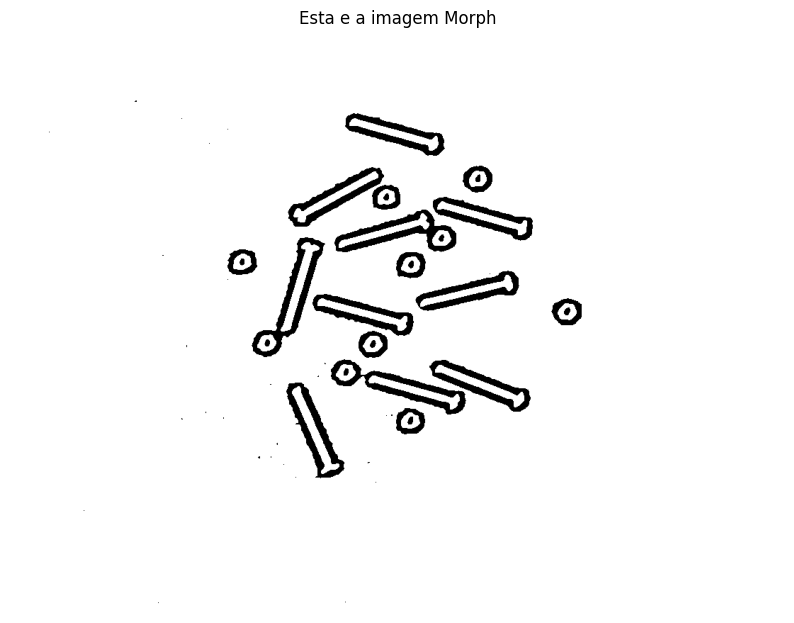

In [6]:
plt.figure(figsize=(10, 8))
#plt.imshow(thresh, cmap='gray')
plt.imshow(morph,cmap='gray')
plt.title("Esta e a imagem Morph")
plt.axis('off')
plt.show()

# 6. Detectar e classificar objetos com marcação
Este bloco de código, na célula drBrkoHMv3xG, é responsável por detectar e classificar os objetos. Ele primeiro encontra os contornos (cv2.findContours) na imagem morfológica (morph). Para cada contorno, calcula a área, o perímetro, a circularidade e a razão de aspecto. Com base nesses valores, especialmente a circularidade e a razão de aspecto, ele tenta classificar o objeto como 'Porca' ou 'Parafuso'. Finalmente, ele desenha um retângulo ao redor do objeto e adiciona um texto com a sua classificação na imagem de saída (output_image).

Total de contornos encontrados: 75
Contornos encontrados: 1
Parafusos encontrados: 0
Porcas encontrados: 0
Parafusos encontrados: 1
Porcas encontrados: 0
Parafusos encontrados: 2
Porcas encontrados: 0
Parafusos encontrados: 3
Porcas encontrados: 0
Parafusos encontrados: 3
Porcas encontrados: 1
Parafusos encontrados: 3
Porcas encontrados: 2
Parafusos encontrados: 3
Porcas encontrados: 3
Parafusos encontrados: 3
Porcas encontrados: 4
Parafusos encontrados: 4
Porcas encontrados: 4
Parafusos encontrados: 5
Porcas encontrados: 4
Parafusos encontrados: 5
Porcas encontrados: 5
Parafusos encontrados: 5
Porcas encontrados: 6
Parafusos encontrados: 6
Porcas encontrados: 6
Parafusos encontrados: 6
Porcas encontrados: 7
Parafusos encontrados: 7
Porcas encontrados: 7
Parafusos encontrados: 8
Porcas encontrados: 7
Parafusos encontrados: 8
Porcas encontrados: 8
Parafusos encontrados: 9
Porcas encontrados: 8
Parafusos encontrados: 9
Porcas encontrados: 9
Parafusos encontrados: 10
Porcas encontrados: 9

/tmp/ipython-input-3305506202.py:64: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 10))


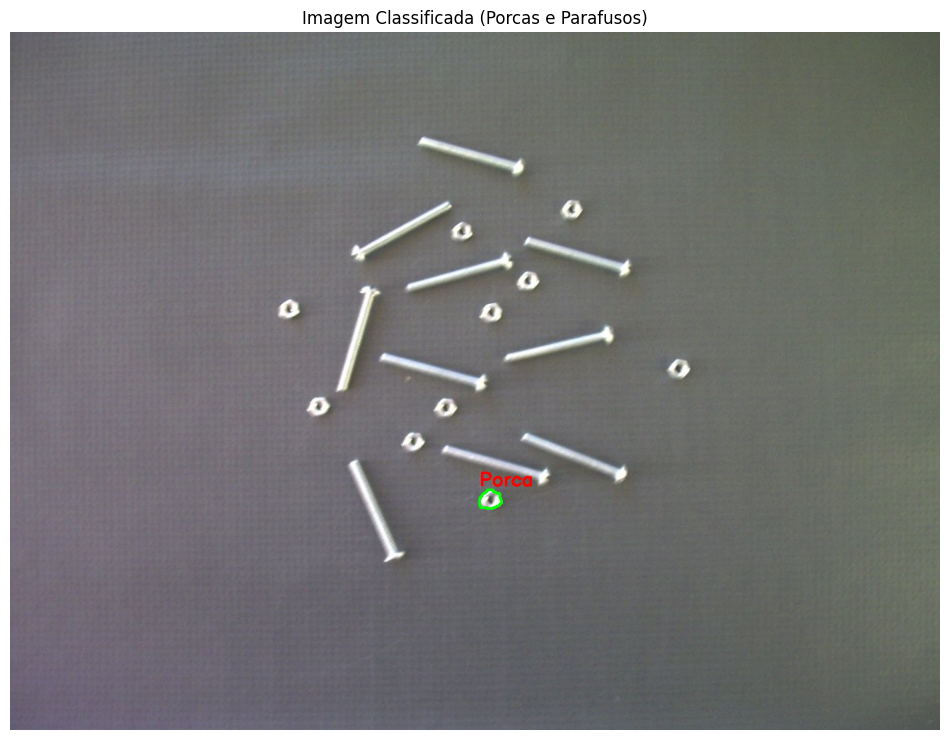

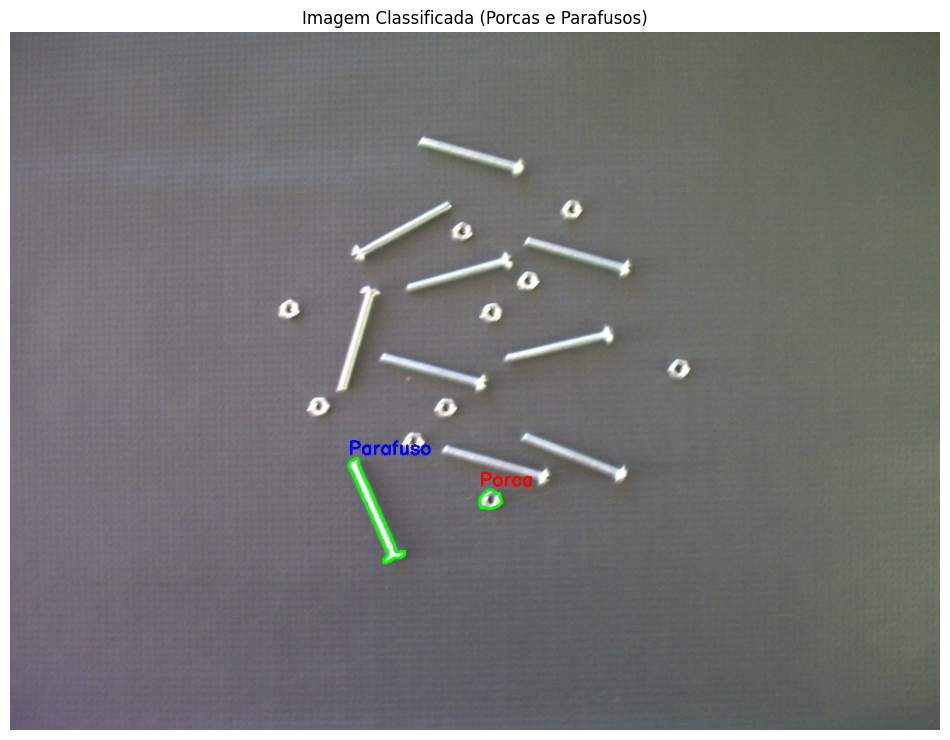

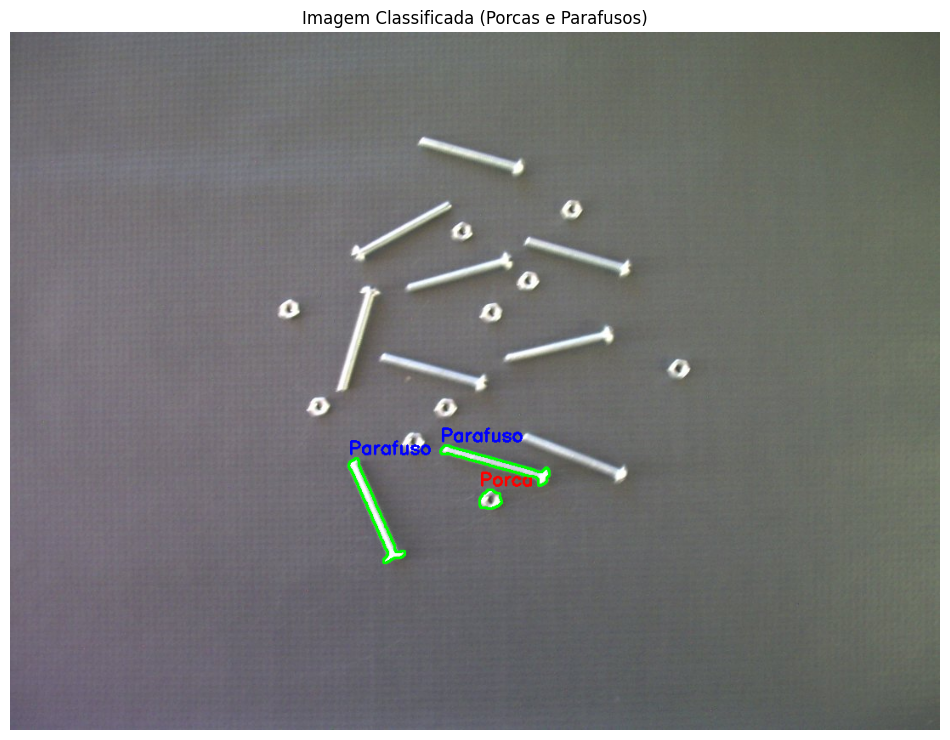

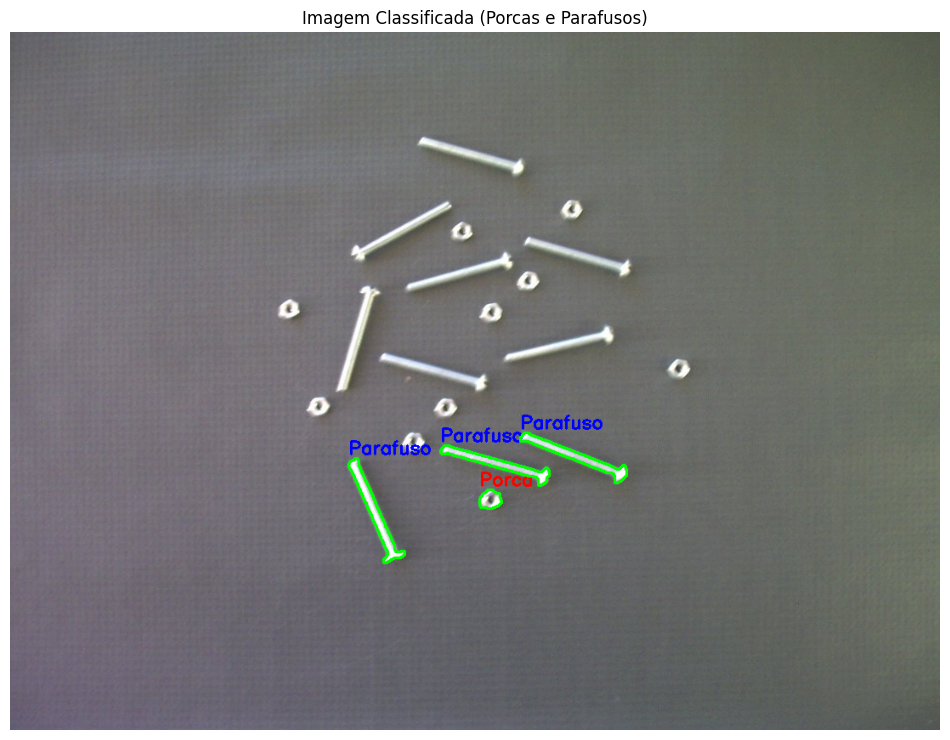

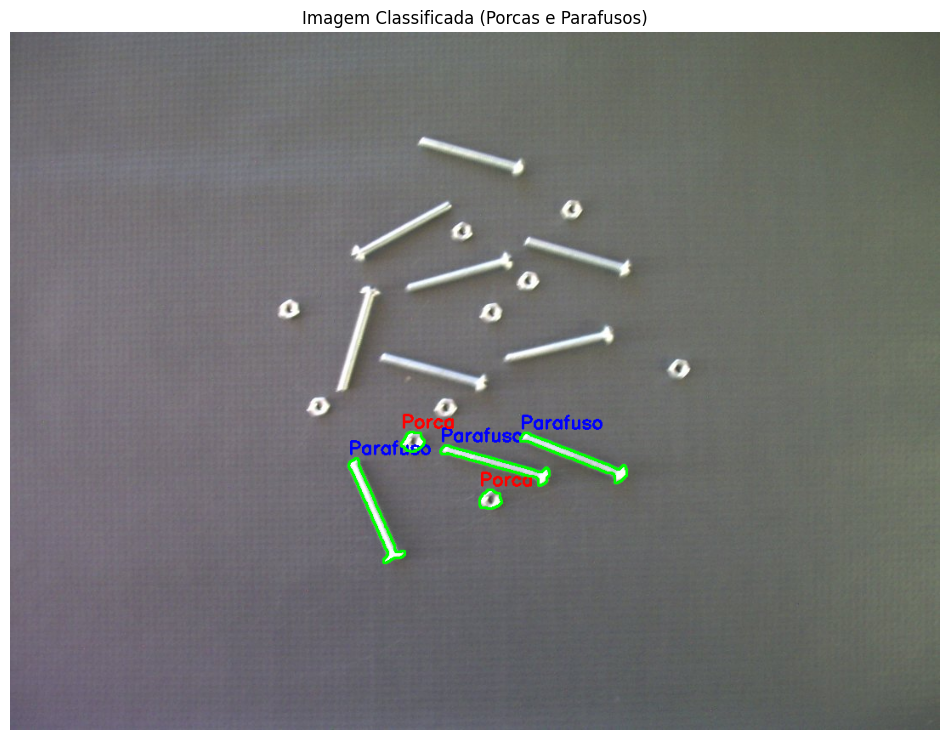

...

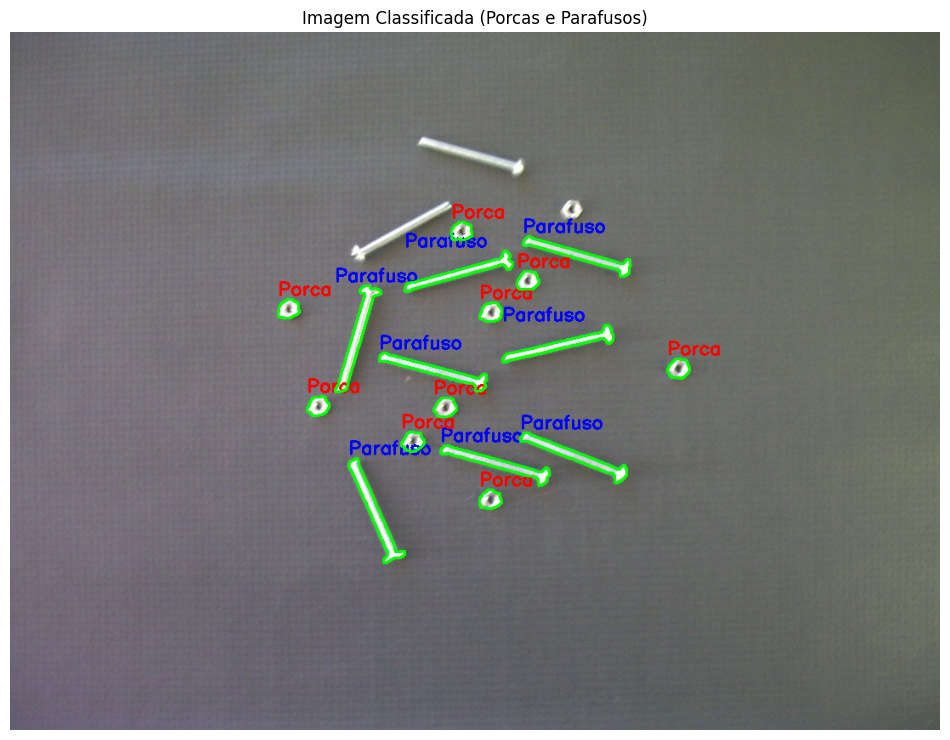

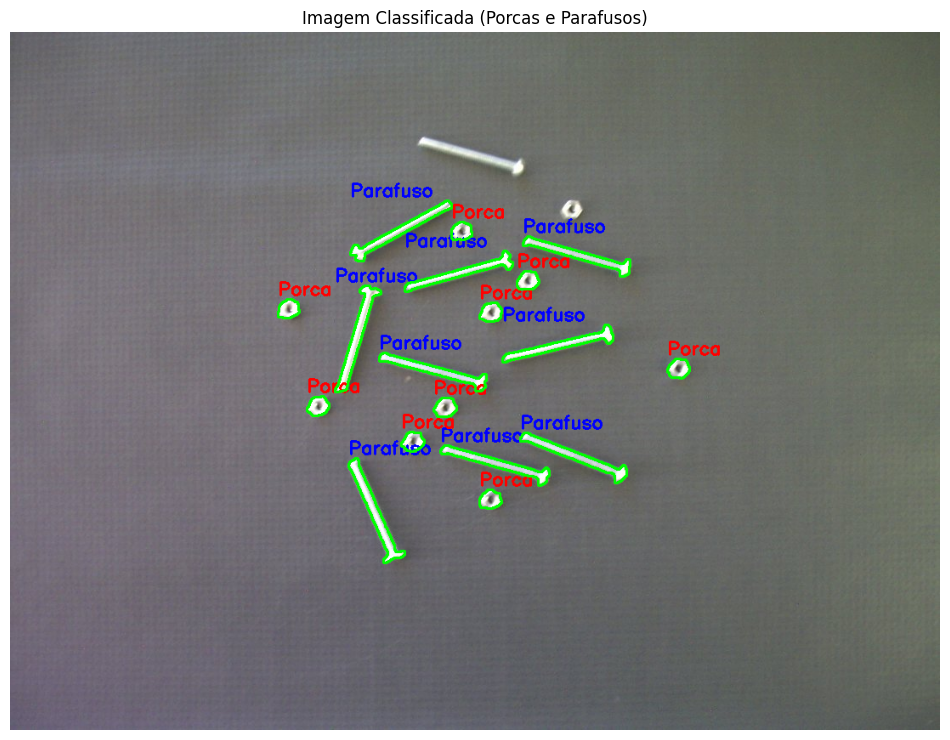

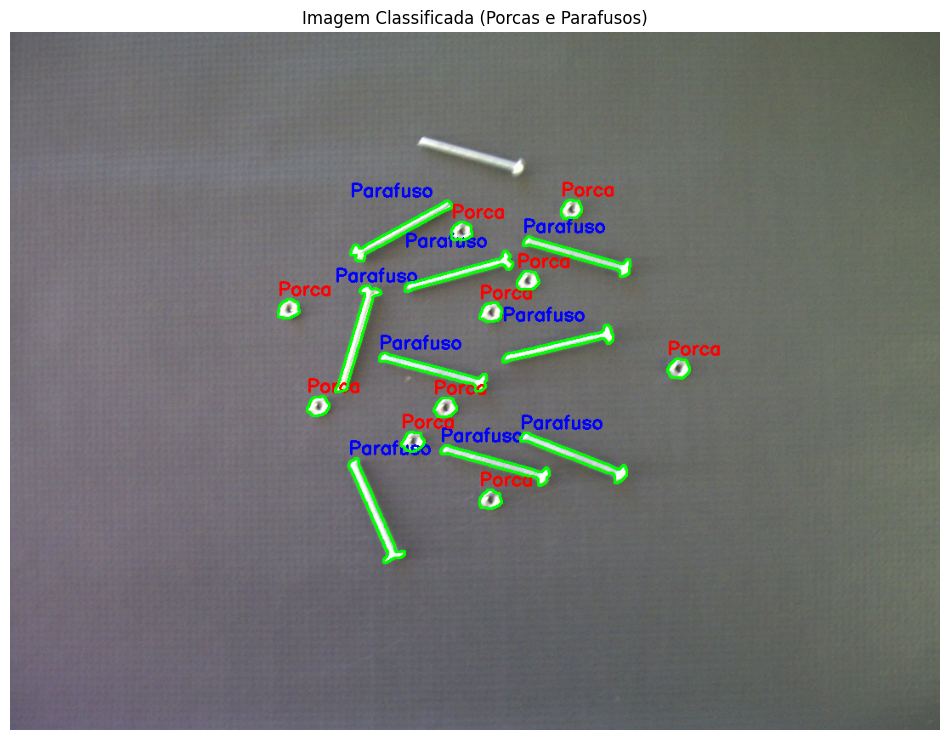

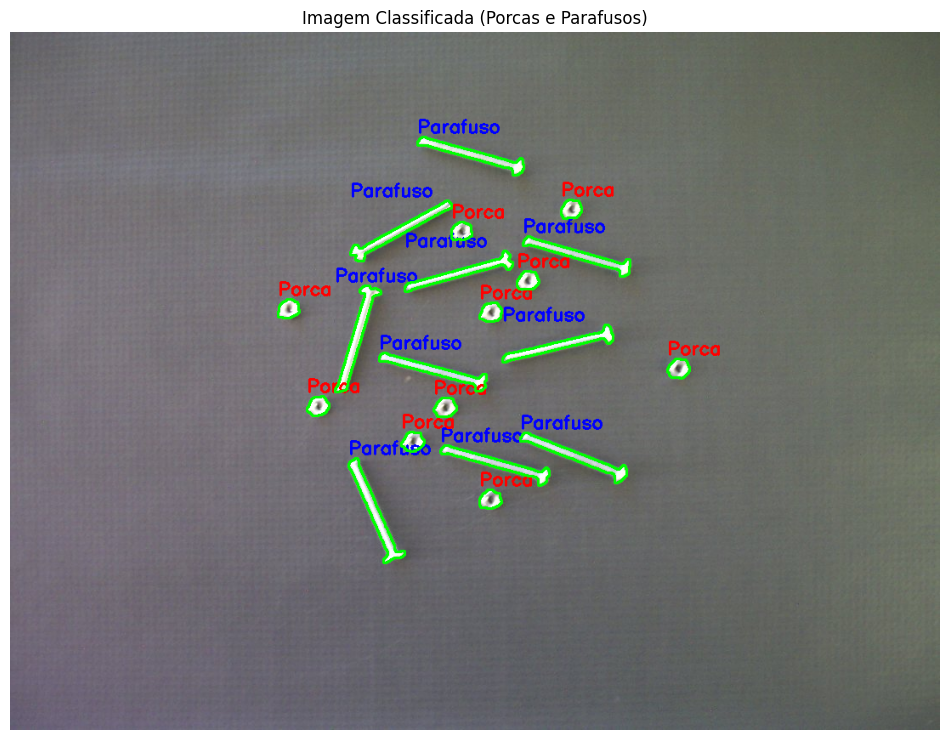

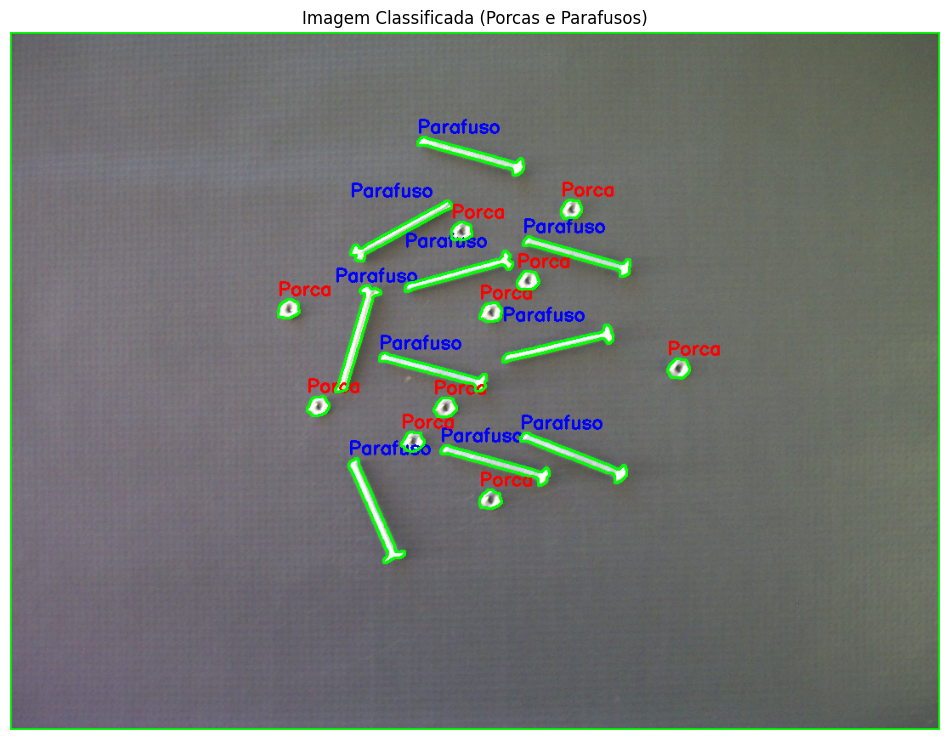

In [21]:
contours, hierarchy = cv2.findContours(morph, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)

# Criar uma cópia da imagem original para desenhar os resultados
output_image = img.copy()

num_porcas = -1
num_parafusos = 0

print(f"Total de contornos encontrados: {len(contours)}")
print(f"Contornos encontrados: {len(hierarchy)}")

# Loop sobre todos os contornos encontrados
for c in range(len(contours)):

    parent = hierarchy[0][c][3]
    #print(f"Parant: {parent}")
    if parent != -1:
        continue

    c = contours[c]
    # 1. Ignorar contornos muito pequenos (que podem ser ruído)
    area = cv2.contourArea(c)
    #print(f"DEBUG: Encontrado contorno com Area = {area}")
    if area < 200:  # IMPORTANTE: Ajuste esse valor mínimo se necessário
        continue

    # 2. Calcular a "Solidez"
    hull = cv2.convexHull(c)
    hull_area = cv2.contourArea(hull)

    # Evitar divisão por zero (caso raro)
    if hull_area == 0:
        continue

    # Esta é a métrica principal!
    solidity = float(area) / hull_area

    #print(f"... Area OK. Solidez = {solidity}")
    # Obter o retângulo delimitador para desenhar o texto
    (x, y, w, h) = cv2.boundingRect(c)

    # 3. Classificar com base na Solidez

    # Se solidez > 0.9 (ou 0.85), é provável que seja sólido (Parafuso)
    if solidity > 0.9:
        num_porcas += 1        # <-- Estava "Parafuso"
        label = f"Porca"        # <-- Estava "Parafuso"
        color = (0, 0, 255)    # <-- Cor Vermelha

    elif solidity <= 0.6:
        # Se for menor, tem um buraco
        num_parafusos += 1     # <-- Estava "Porca"
        label = f"Parafuso"     # <-- Estava "Porca"
        color = (255, 0, 0)    # <-- Cor Azul

    print(f"Parafusos encontrados: {num_parafusos}")
    print(f"Porcas encontrados: {num_porcas}")
    # Desenhar o contorno e o texto na imagem de saída
    cv2.drawContours(output_image, [c], -1, (0, 255, 0), 2) # Contorno verde
    cv2.putText(output_image, label, (x, y - 5),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, color, 2)


    plt.figure(figsize=(12, 10))
    plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
    plt.title('Imagem Classificada (Porcas e Parafusos)')
    plt.axis('off')

# 7. validaçao
Este bloco de código realiza a validação final da contagem de parafusos e porcas. Ele verifica se as quantidades detectadas (parafusos e porcas) correspondem às quantidades esperadas (que seriam 10 para cada, implícito nos cálculos 10 - parafusos e 10 - porcas). Com base nessa comparação, ele gera uma mensagem (msg) indicando se o 'Conjunto' foi 'Aprovado' ou 'Reprovado'. Se for reprovado, a mensagem detalha quantos parafusos e/ou porcas estão faltando ou em excesso.

In [22]:
# Validação final
msg = ''
faltam_p = 10 - num_parafusos
faltam_o = 10 - num_porcas
if faltam_p == 0 and faltam_o == 0:
    msg = '✅ Conjunto Aprovado'

else:
    msg = '❌ Conjunto Reprovado:\n'
    if faltam_o != 0:
        msg += f'- Faltam {abs(faltam_o)} porca(s)\n' if faltam_o > 0 else f'- {abs(faltam_o)} porca(s) em excesso\n'
    if faltam_p != 0:
        msg += f'- Faltam {abs(faltam_p)} parafuso(s)\n' if faltam_p > 0 else f'- {abs(faltam_p)} parafuso(s) em excesso\n'
print(msg)

✅ Conjunto Aprovado


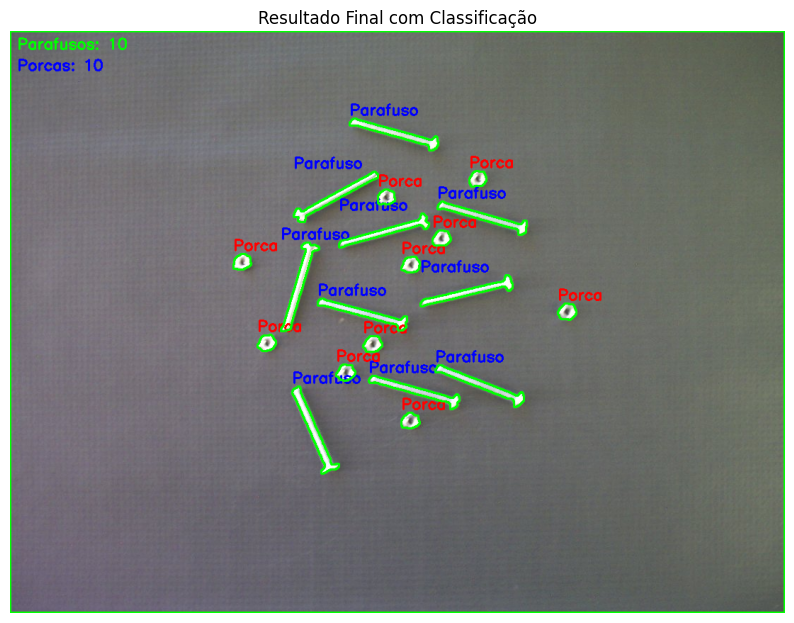

In [28]:
# Exibir imagem final com contagem
cv2.putText(output_image, f'Parafusos: {num_parafusos}', (10,25), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,0), 2)
cv2.putText(output_image, f'Porcas: {num_porcas}', (10,55), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (255,0,0), 2)

plt.figure(figsize=(10,8))
plt.imshow(cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB))
plt.title('Resultado Final com Classificação')
plt.axis('off')
plt.show()